In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from templates import *
from templates_cls import *
from experiment_classifier import ClsModel

In [3]:
device = 'cuda:0'
conf = ffhq256_autoenc()
# print(conf.name)
model = LitModel(conf)
state = torch.load(f'checkpoints/{conf.name}/last.ckpt', map_location='cpu')
model.load_state_dict(state['state_dict'], strict=False)
model.ema_model.eval()
model.ema_model.to(device);

Global seed set to 0


Model params: 160.69 M


In [4]:
cls_conf = ffhq256_autoenc_cls()
cls_model = ClsModel(cls_conf)
state = torch.load(f'checkpoints/{cls_conf.name}/last.ckpt',
                    map_location='cpu')
print('latent step:', state['global_step'])
cls_model.load_state_dict(state['state_dict'], strict=False)
cls_model.to(device);

Global seed set to 0


loading pretrain ... 130M
step: 1563562
loading latent stats ...
latent step: 9375


## 選択

In [114]:
is_avg = False  # avg_face用 ※eye2mouthはできない
is_crop = False  # crop用 ※all, poseはできない
if is_avg:
    img_from_base_dir = 'imgs_test/imgs_synthetic_avg/avg_face3/'
elif is_crop:
    img_from_base_dir = 'imgs_test/imgs_crop_and/'
else:
    img_from_base_dir = 'imgs_test/imgs_synthetic/'
    
from_dirs = []
for i,file in enumerate(os.listdir(img_from_base_dir)):
    print(f'{i:2}: {file}')
    from_dirs.append(file)

 0: ookawa_default-ookawa_angry2
 1: yotaka_default-yotaka_angry2
 2: yotaka_default-yotaka_smile


In [157]:
ind_from = 2
img_from_dir = img_from_base_dir + f"/{from_dirs[ind_from]}"  # 選択
name_from_dir = from_dirs[ind_from]

for i,file in enumerate(os.listdir(img_from_dir)):
    print(f'{i:2}: {file}')

 0: eye-mouth.png
 1: eye.png
 2: eye2-mouth.png
 3: eye2.png
 4: face-all.png
 5: mouth-nose.png
 6: mouth.png
 7: original_from.png
 8: original_to.png
 9: pose_from.png
10: pose_to.png


In [158]:
img_to_dir = 'imgs_align'
for i,file in enumerate(os.listdir(img_to_dir)):
    print(f'{i:2}: {file}')

 0: azuki_default.png
 1: ceo_default.png
 2: check1.png
 3: check2.png
 4: danda_default.png
 5: detective.png
 6: detective_02.png
 7: glasses.png
 8: idPhoto.png
 9: mio_happy.png
10: mio_shock.png
11: mio_silence.png
12: mio_u.png
13: nanko_default.png
14: ookawa_angry.png
15: ookawa_angry2.png
16: ookawa_default.png
17: ookawa_high.png
18: ookawa_regret.png
19: ookawa_smile.png
20: ookawa_surprised.png
21: pharmacist.png
22: saki.png
23: saki_glasses.png
24: sandy.png
25: takebe_default.png
26: test01.png
27: test01_02.png
28: test01_03.png
29: test01_04.png
30: test02.png
31: test02_02.png
32: test02_03.png
33: woman_default.png
34: yotaka_angry.png
35: yotaka_angry2.png
36: yotaka_bald.png
37: yotaka_bushy.png
38: yotaka_default.png
39: yotaka_gj.png
40: yotaka_smile.png
41: yotaka_smile2.png


In [159]:
data = ImageDataset(img_from_dir, image_size=conf.img_size, exts=['jpg', 'JPG', 'png'], do_augment=False, sort_names=True)
if is_avg:
    ind_batch_from = [12,13,14,15,6,7,4,5,2,3,10,11,0,1,8,9]
elif is_crop:
    ind_batch_from = [8,13,4,7,0,3,9,12,5,6,1,2,10,11]
else:
    ind_batch_from = [7,8,9,10,4,1,3,6,0,2,5]  # [ori_fm, ori_to, pose_fm_pose_to, fall, eye, eye2, mouth, eyemouth, eye2mouth, mouthnose] いじらない
batch_from = np.array(data[ind_batch_from[0]]['img'][None])
names_batch_from = [os.path.splitext(str(data.paths[ind_batch_from[0]]))[0]]
for i in range(1, len(ind_batch_from)):
    batch_from = np.append(batch_from, data[ind_batch_from[i]]['img'][None], axis=0)
    names_batch_from.append(os.path.splitext(str(data.paths[ind_batch_from[i]]))[0])
batch_from = torch.tensor(batch_from)

data2 = ImageDataset(img_to_dir, image_size=conf.img_size, exts=['jpg', 'JPG', 'png'], do_augment=False)
ind_batch_to = [7,31]  # 選択
# ind_batch_to = [24]
batch_to = np.array(data2[ind_batch_to[0]]['img'][None])
names_batch_to = [os.path.splitext(str(data2.paths[ind_batch_to[0]]))[0]]
for i in range(1, len(ind_batch_to)):
    batch_to = np.append(batch_to, data2[ind_batch_to[i]]['img'][None], axis=0)
    names_batch_to.append(os.path.splitext(str(data2.paths[ind_batch_to[i]]))[0])
batch_to = torch.tensor(batch_to)

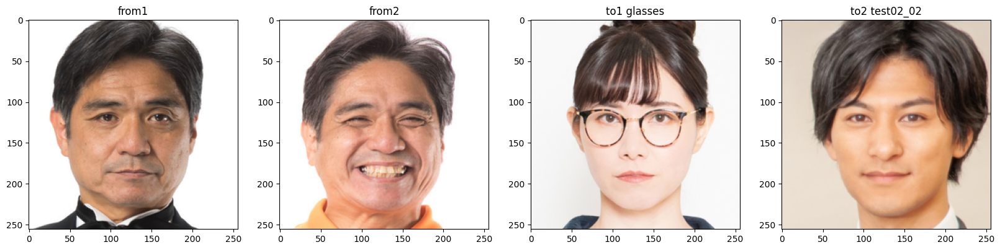

In [160]:
import matplotlib.pyplot as plt

num_to = len(batch_to)
fig, ax = plt.subplots(1, 2+num_to, figsize=(5*(2+num_to), 5))
for i in range(2):
    ax[i].imshow(batch_from[i].permute([1, 2, 0]) / 2 + 0.5)
    ax[i].set_title(f"from{i+1}")

for i in range(num_to):
    ax[i+2].imshow(batch_to[i].permute([1, 2, 0]) / 2 + 0.5)
    ax[i+2].set_title(f"to{i+1} {names_batch_to[i]}")

plt.show()

In [161]:
cond_to = torch.tensor([], device=device)
cond_to_norm = torch.tensor([], device=device)
xT = torch.tensor([], device=device)
for i in range(num_to):
    cond_to = torch.cat([cond_to, model.encode(batch_to[i][None].to(device))], dim=0)
    cond_to_norm = torch.cat([cond_to_norm, cls_model.normalize(cond_to[i])], dim=0)
    xT = torch.cat([xT, model.encode_stochastic(batch_to[i][None].to(device), cond_to[i][None], T=250)], dim=0)

In [162]:
alpha = torch.tensor(np.linspace(0, 1, 11, dtype=np.float32)).to(device)

## all

In [163]:
index_pts = [0,1]
batch_from_all = torch.stack([batch_from[index_pts[0]], batch_from[index_pts[1]]]).to(device)
cond_from_all = model.encode(batch_from_all)
cond_change_all = cls_model.normalize(cond_from_all[1][None]) - cls_model.normalize(cond_from_all[0][None])

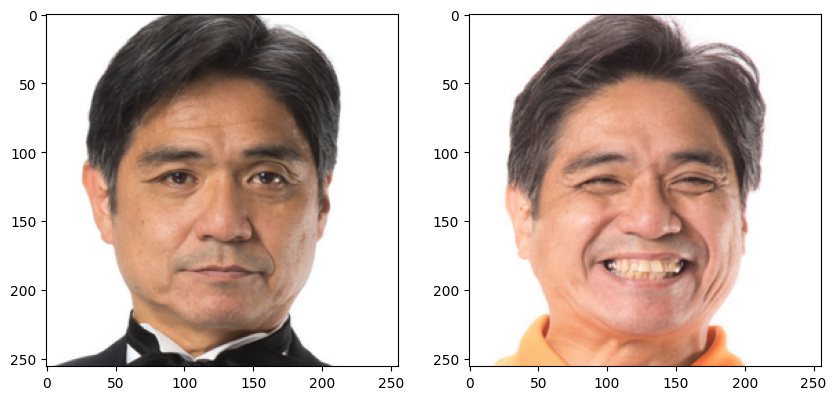

In [164]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(batch_from[index_pts[0]].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_from[index_pts[1]].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [165]:
preds_all = torch.tensor([], device=device)
for i in range(num_to):
    preds_tmp = torch.tensor([], device=device)
    for j,alp in enumerate(alpha):
        cond2 = cond_to_norm[i] + alp * cond_change_all
        cond2 = cls_model.denormalize(cond2)
        pred = model.render(xT[i][None], cond2, T=20)
        preds_tmp = torch.cat([preds_tmp, pred], dim=0)
    preds_all = torch.cat([preds_all, preds_tmp[None]], dim=0)

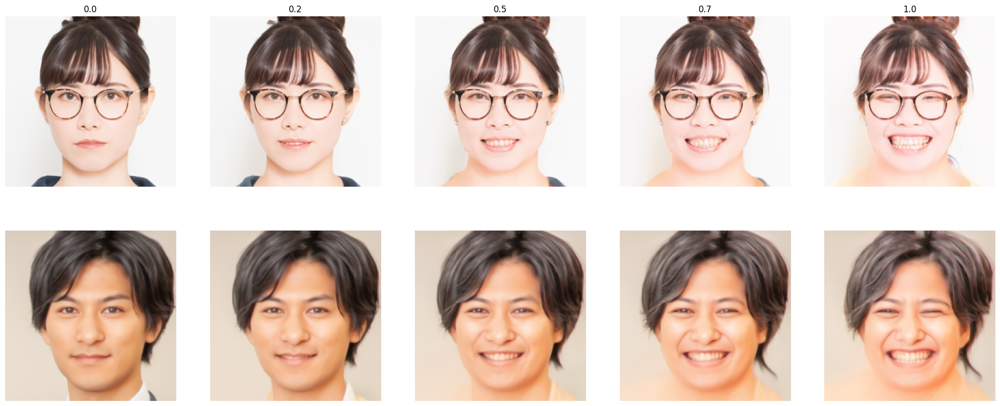

In [166]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_all):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_all) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [167]:
from PIL import Image

preds_all_pil = []
for pred in preds_all:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_all_pil.append(pred_pil)

## pose

In [168]:
index_pts = [2,3]
batch_from_pose = torch.stack([batch_from[index_pts[0]], batch_from[index_pts[1]]]).to(device)
cond_from_pose = model.encode(batch_from_pose)
cond_change_pose = cls_model.normalize(cond_from_pose[1][None]) - cls_model.normalize(cond_from_pose[0][None])

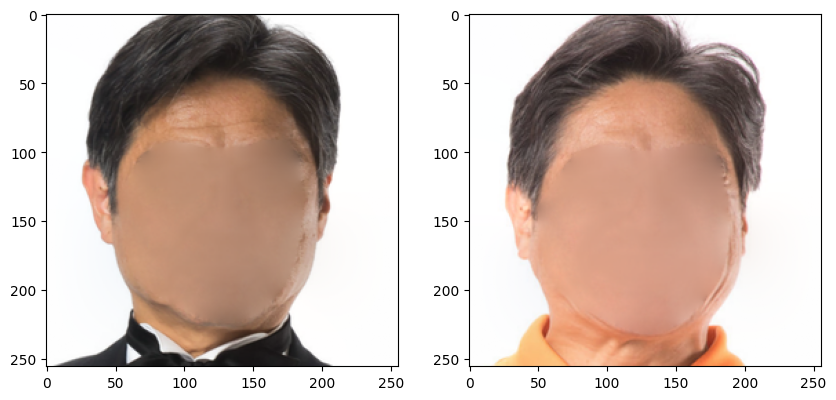

In [169]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(batch_from[index_pts[0]].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_from[index_pts[1]].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [170]:
preds_pose = torch.tensor([], device=device)
for i in range(num_to):
    preds_tmp = torch.tensor([], device=device)
    for j,alp in enumerate(alpha):
        cond2 = cond_to_norm[i] + alp * cond_change_pose
        cond2 = cls_model.denormalize(cond2)
        pred = model.render(xT[i][None], cond2, T=20)
        preds_tmp = torch.cat([preds_tmp, pred], dim=0)
    preds_pose = torch.cat([preds_pose, preds_tmp[None]], dim=0)

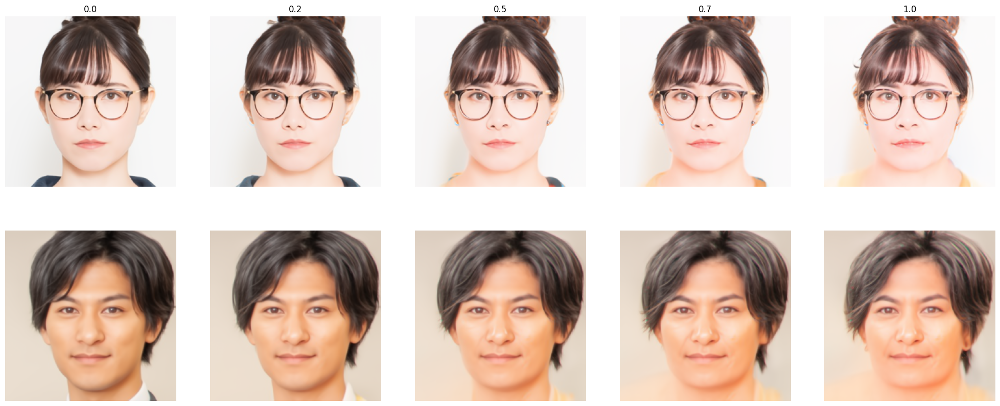

In [171]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_pose):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_pose) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [172]:
from PIL import Image

preds_pose_pil = []
for pred in preds_pose:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_pose_pil.append(pred_pil)

## face-all

In [99]:
if is_avg:
    index_pts = [4,5]  # avg_face用
elif is_crop:
    index_pts = [0,1]  # crop用
else:
    index_pts = [0,4]
batch_from_faceall = torch.stack([batch_from[index_pts[0]], batch_from[index_pts[1]]]).to(device)
cond_from_faceall = model.encode(batch_from_faceall)
cond_change_faceall = cls_model.normalize(cond_from_faceall[1][None]) - cls_model.normalize(cond_from_faceall[0][None])

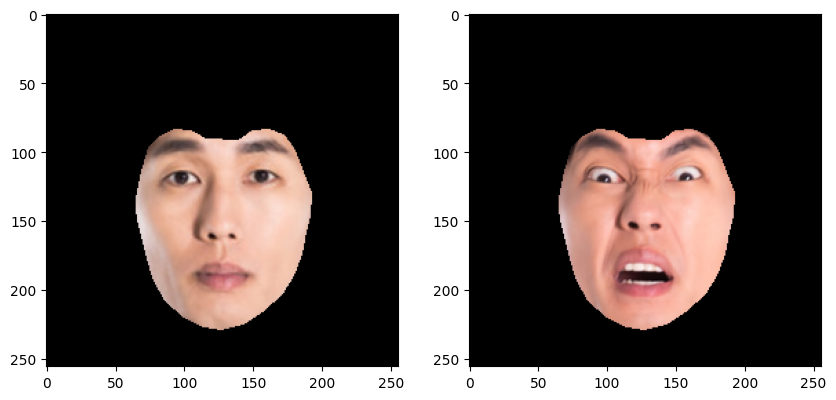

In [100]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(batch_from[index_pts[0]].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_from[index_pts[1]].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [101]:
preds_faceall = torch.tensor([], device=device)
for i in range(num_to):
    preds_tmp = torch.tensor([], device=device)
    for j,alp in enumerate(alpha):
        cond2 = cond_to_norm[i] + alp * cond_change_faceall
        cond2 = cls_model.denormalize(cond2)
        pred = model.render(xT[i][None], cond2, T=20)
        preds_tmp = torch.cat([preds_tmp, pred], dim=0)
    preds_faceall = torch.cat([preds_faceall, preds_tmp[None]], dim=0)

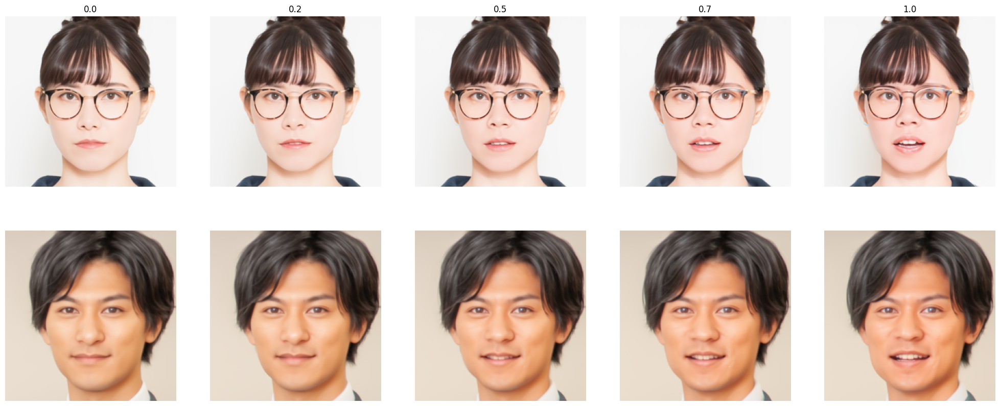

In [102]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_faceall):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_faceall) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [103]:
from PIL import Image

preds_faceall_pil = []
for pred in preds_faceall:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_faceall_pil.append(pred_pil)

## eye

In [130]:
if is_avg:
    index_pts = [6,7]  # avg_face用
elif is_crop:
    index_pts = [2,3]  # crop用
else:
    index_pts = [0,5]
batch_from_eye = torch.stack([batch_from[index_pts[0]], batch_from[index_pts[1]]]).to(device)
cond_from_eye = model.encode(batch_from_eye)
cond_change_eye = cls_model.normalize(cond_from_eye[1][None]) - cls_model.normalize(cond_from_eye[0][None])

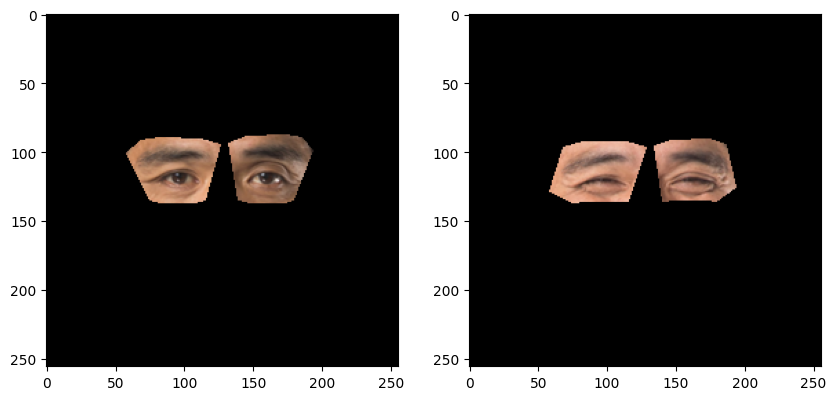

In [131]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(batch_from[index_pts[0]].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_from[index_pts[1]].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [132]:
preds_eye = torch.tensor([], device=device)
for i in range(num_to):
    preds_tmp = torch.tensor([], device=device)
    for j,alp in enumerate(alpha):
        cond2 = cond_to_norm[i] + alp * cond_change_eye
        cond2 = cls_model.denormalize(cond2)
        pred = model.render(xT[i][None], cond2, T=20)
        preds_tmp = torch.cat([preds_tmp, pred], dim=0)
    preds_eye = torch.cat([preds_eye, preds_tmp[None]], dim=0)

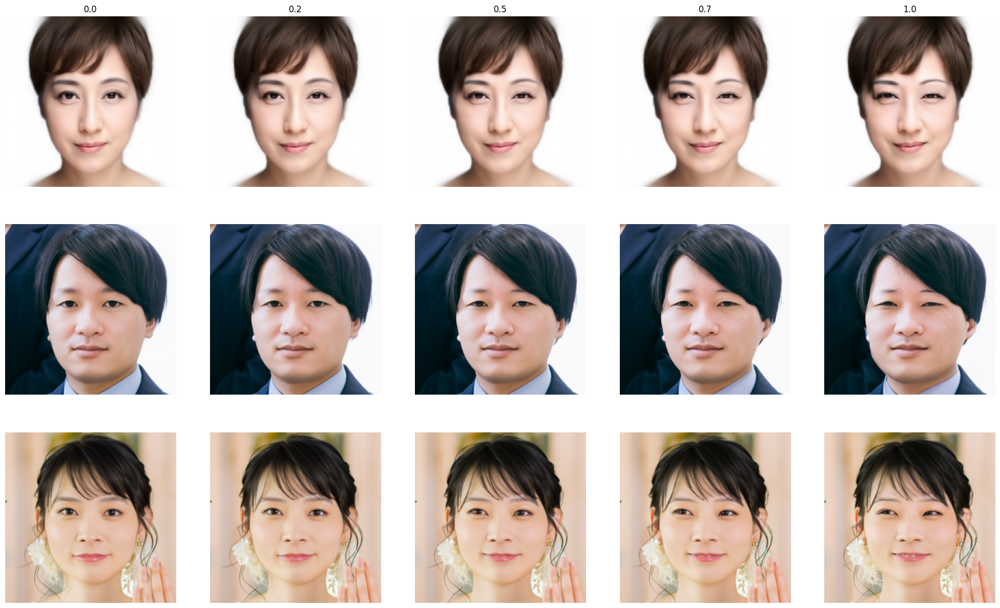

In [133]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_eye):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_eye) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [134]:
from PIL import Image

preds_eye_pil = []
for pred in preds_eye:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_eye_pil.append(pred_pil)

## eye2

In [84]:
if is_avg:
    index_pts = [8,9]  # avg_face用
elif is_crop:
    index_pts = [4,5]  # crop用
else:
    index_pts = [0,6]
batch_from_eye2 = torch.stack([batch_from[index_pts[0]], batch_from[index_pts[1]]]).to(device)
cond_from_eye2 = model.encode(batch_from_eye2)
cond_change_eye2 = cls_model.normalize(cond_from_eye2[1][None]) - cls_model.normalize(cond_from_eye2[0][None])

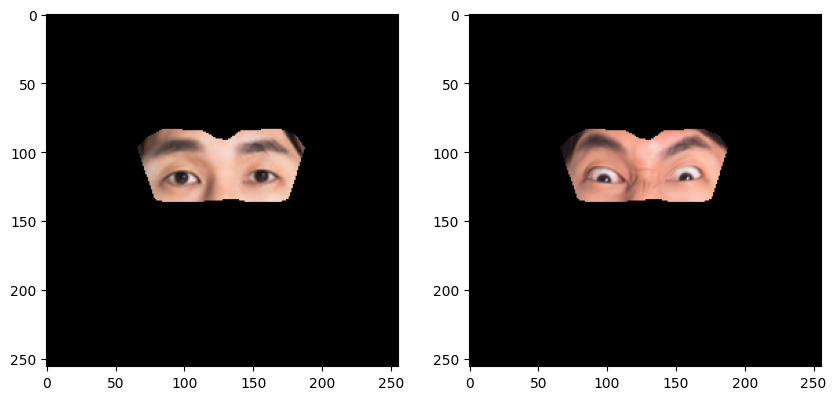

In [85]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(batch_from[index_pts[0]].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_from[index_pts[1]].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [86]:
preds_eye2 = torch.tensor([], device=device)
for i in range(num_to):
    preds_tmp = torch.tensor([], device=device)
    for j,alp in enumerate(alpha):
        cond2 = cond_to_norm[i] + alp * cond_change_eye2
        cond2 = cls_model.denormalize(cond2)
        pred = model.render(xT[i][None], cond2, T=20)
        preds_tmp = torch.cat([preds_tmp, pred], dim=0)
    preds_eye2 = torch.cat([preds_eye2, preds_tmp[None]], dim=0)

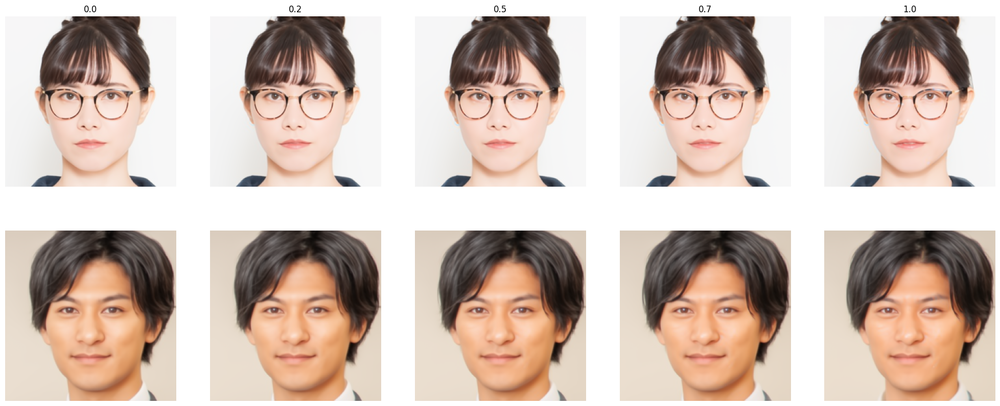

In [87]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_eye2):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_eye2) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [88]:
from PIL import Image

preds_eye2_pil = []
for pred in preds_eye2:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_eye2_pil.append(pred_pil)

## mouth

In [89]:
if is_avg:
    index_pts = [10,11]  # avg_face用
elif is_crop:
    index_pts = [6,7]  # crop用
else:
    index_pts = [0,7]
batch_from_mouth = torch.stack([batch_from[index_pts[0]], batch_from[index_pts[1]]]).to(device)
cond_from_mouth = model.encode(batch_from_mouth)
cond_change_mouth = cls_model.normalize(cond_from_mouth[1][None]) - cls_model.normalize(cond_from_mouth[0][None])

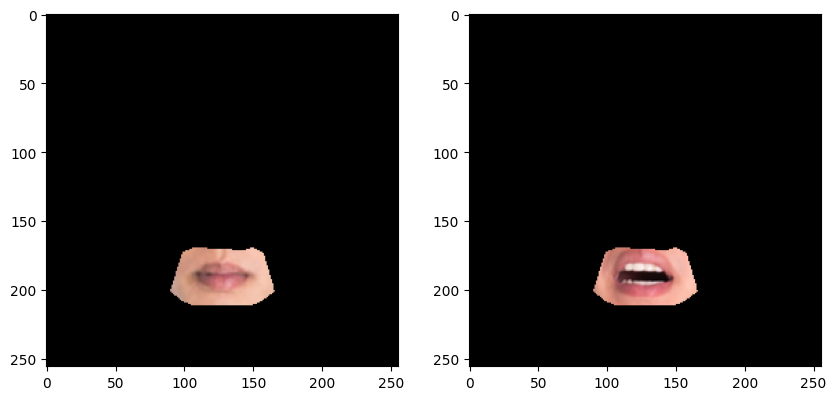

In [90]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(batch_from[index_pts[0]].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_from[index_pts[1]].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [91]:
preds_mouth = torch.tensor([], device=device)
for i in range(num_to):
    preds_tmp = torch.tensor([], device=device)
    for j,alp in enumerate(alpha):
        cond2 = cond_to_norm[i] + alp * cond_change_mouth
        cond2 = cls_model.denormalize(cond2)
        pred = model.render(xT[i][None], cond2, T=20)
        preds_tmp = torch.cat([preds_tmp, pred], dim=0)
    preds_mouth = torch.cat([preds_mouth, preds_tmp[None]], dim=0)

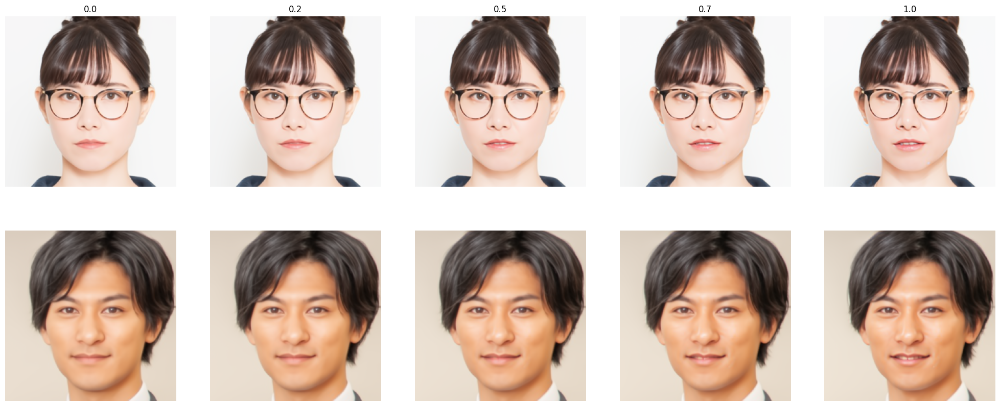

In [92]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_mouth):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_mouth) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [93]:
from PIL import Image

preds_mouth_pil = []
for pred in preds_mouth:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_mouth_pil.append(pred_pil)

## eye&mouth

In [145]:
if is_avg:
    index_pts = [12,13]  # avg_face用
elif is_crop:
    index_pts = [8,9]  # crop用
else:
    index_pts = [0,8]
batch_from_eyemouth = torch.stack([batch_from[index_pts[0]], batch_from[index_pts[1]]]).to(device)
cond_from_eyemouth = model.encode(batch_from_eyemouth)
cond_change_eyemouth = cls_model.normalize(cond_from_eyemouth[1][None]) - cls_model.normalize(cond_from_eyemouth[0][None])

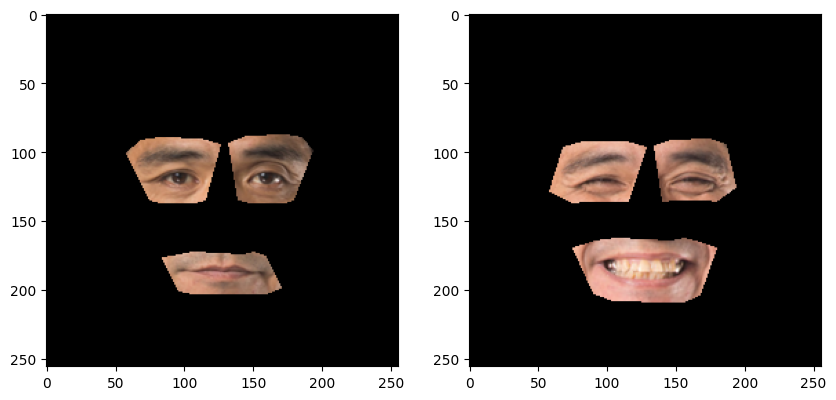

In [146]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(batch_from[index_pts[0]].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_from[index_pts[1]].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [147]:
preds_eyemouth = torch.tensor([], device=device)
for i in range(num_to):
    preds_tmp = torch.tensor([], device=device)
    for j,alp in enumerate(alpha):
        cond2 = cond_to_norm[i] + alp * cond_change_eyemouth
        cond2 = cls_model.denormalize(cond2)
        pred = model.render(xT[i][None], cond2, T=20)
        preds_tmp = torch.cat([preds_tmp, pred], dim=0)
    preds_eyemouth = torch.cat([preds_eyemouth, preds_tmp[None]], dim=0)

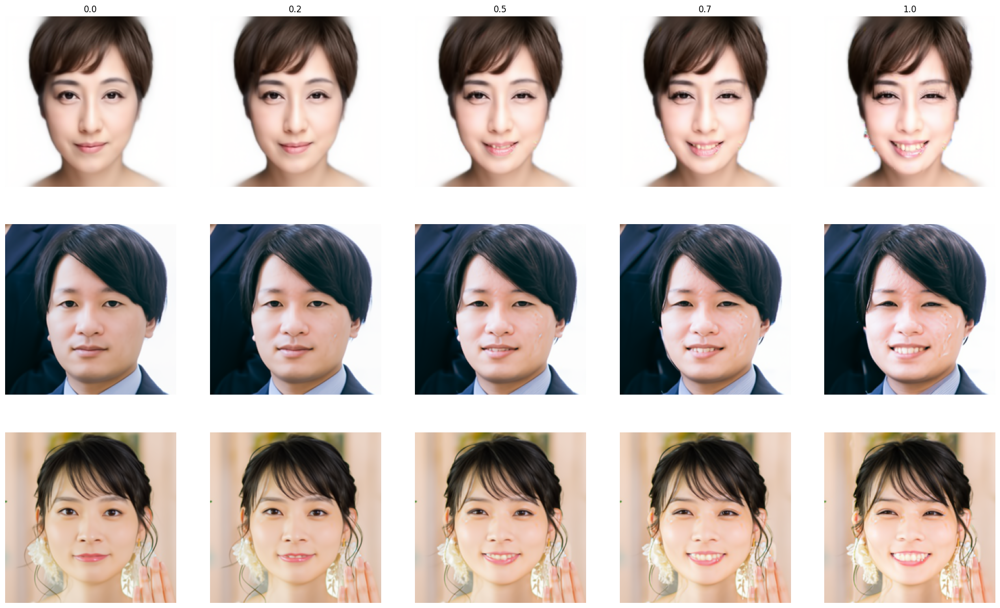

In [148]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_eyemouth):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_eyemouth) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [149]:
from PIL import Image

preds_eyemouth_pil = []
for pred in preds_eyemouth:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_eyemouth_pil.append(pred_pil)

## eye2&mouth

In [94]:
if is_crop:
    index_pts = [10,11]  # crop用
else:
    index_pts = [0,9]
batch_from_eye2mouth = torch.stack([batch_from[index_pts[0]], batch_from[index_pts[1]]]).to(device)
cond_from_eye2mouth = model.encode(batch_from_eye2mouth)
cond_change_eye2mouth = cls_model.normalize(cond_from_eye2mouth[1][None]) - cls_model.normalize(cond_from_eye2mouth[0][None])

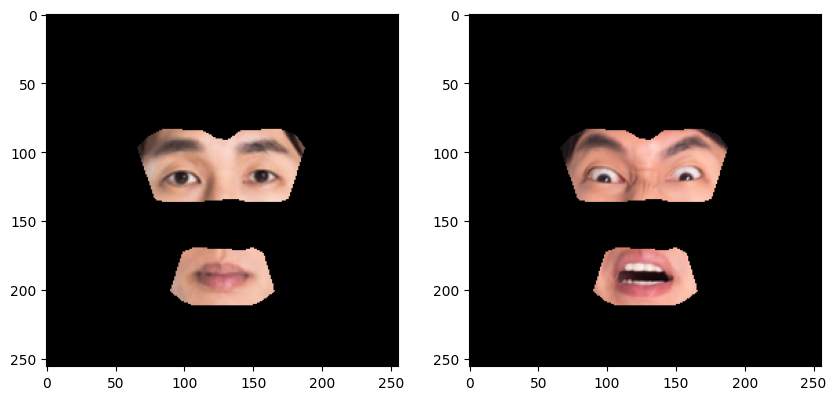

In [95]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(batch_from[index_pts[0]].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_from[index_pts[1]].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [96]:
preds_eye2mouth = torch.tensor([], device=device)
for i in range(num_to):
    preds_tmp = torch.tensor([], device=device)
    for j,alp in enumerate(alpha):
        cond2 = cond_to_norm[i] + alp * cond_change_eye2mouth
        cond2 = cls_model.denormalize(cond2)
        pred = model.render(xT[i][None], cond2, T=20)
        preds_tmp = torch.cat([preds_tmp, pred], dim=0)
    preds_eye2mouth = torch.cat([preds_eye2mouth, preds_tmp[None]], dim=0)

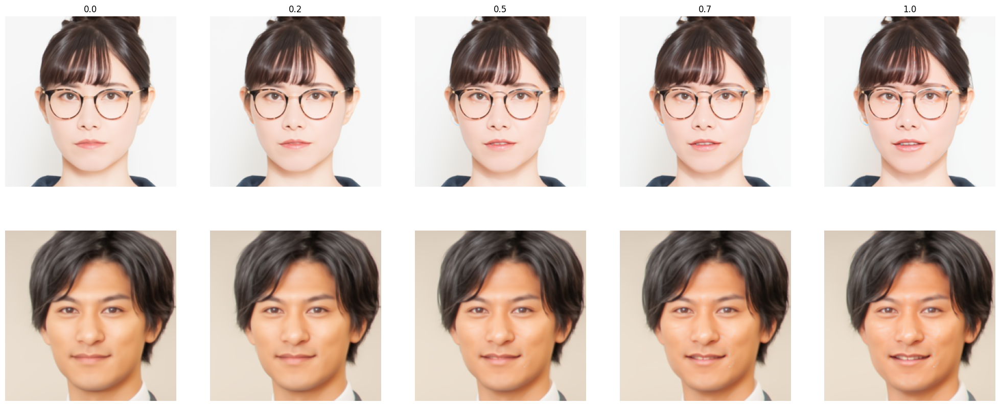

In [97]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_eye2mouth):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_eye2mouth) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [98]:
from PIL import Image

preds_eye2mouth_pil = []
for pred in preds_eye2mouth:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_eye2mouth_pil.append(pred_pil)

## mouth&nose

In [155]:
if is_avg:
    index_pts = [14,15]  # avg_face用
elif is_crop:
    index_pts = [12,13]  # crop用
else:
    index_pts = [0,10]
batch_from_mouthnose = torch.stack([batch_from[index_pts[0]], batch_from[index_pts[1]]]).to(device)
cond_from_mouthnose = model.encode(batch_from_mouthnose)
cond_change_mouthnose = cls_model.normalize(cond_from_mouthnose[1][None]) - cls_model.normalize(cond_from_mouthnose[0][None])

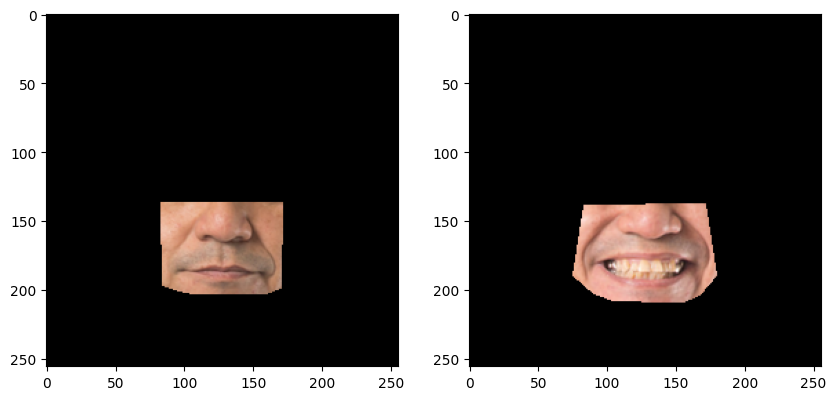

In [156]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(batch_from[index_pts[0]].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_from[index_pts[1]].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [157]:
preds_mouthnose = torch.tensor([], device=device)
for i in range(num_to):
    preds_tmp = torch.tensor([], device=device)
    for j,alp in enumerate(alpha):
        cond2 = cond_to_norm[i] + alp * cond_change_mouthnose
        cond2 = cls_model.denormalize(cond2)
        pred = model.render(xT[i][None], cond2, T=20)
        preds_tmp = torch.cat([preds_tmp, pred], dim=0)
    preds_mouthnose = torch.cat([preds_mouthnose, preds_tmp[None]], dim=0)

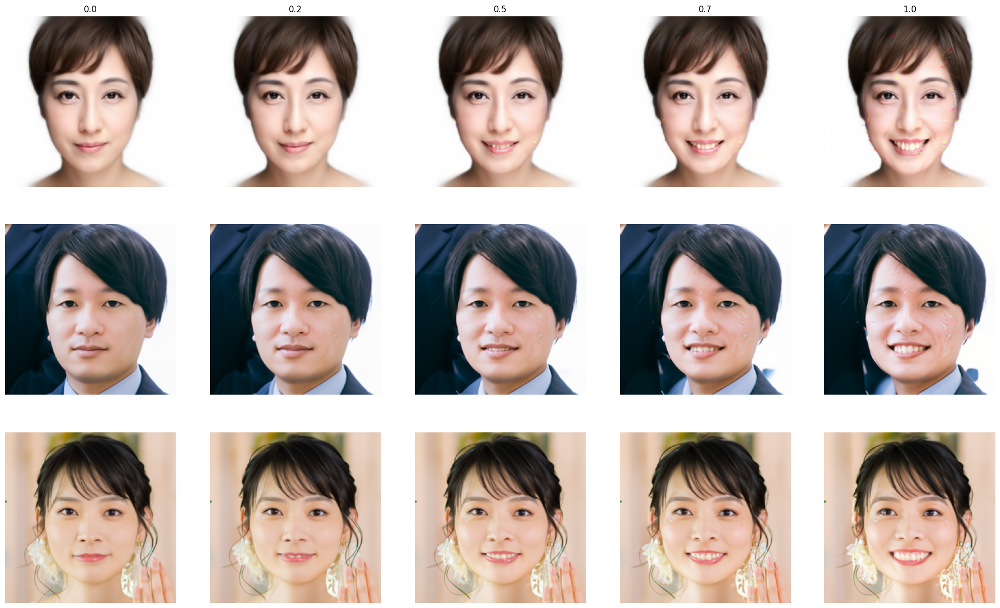

In [158]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_mouthnose):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_mouthnose) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [159]:
from PIL import Image

preds_mouthnose_pil = []
for pred in preds_mouthnose:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_mouthnose_pil.append(pred_pil)

## gifの保存

In [173]:
if is_avg:
    dst_dir = f"imgs_test/imgs_parts_transfer_avg/{name_from_dir}"
elif is_crop:
    dst_dir = f"imgs_test/imgs_parts_transfer_crop_and/{name_from_dir}"
else:
    dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"

### all

In [174]:
# dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
for i,pred_pil in enumerate(preds_all_pil):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/all/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

### pose

In [175]:
# dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
for i,pred_pil in enumerate(preds_pose_pil):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/pose/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

### face-all

In [105]:
# dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
for i,pred_pil in enumerate(preds_faceall_pil):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/face-all/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

### eye

In [162]:
# dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
for i,pred_pil in enumerate(preds_eye_pil):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/eye/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

### eye2

In [106]:
# dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
for i,pred_pil in enumerate(preds_eye2_pil):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/eye2/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

### mouth

In [107]:
# dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
for i,pred_pil in enumerate(preds_mouth_pil):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/mouth/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

### eye&mouth

In [ ]:
# dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
for i,pred_pil in enumerate(preds_eyemouth_pil):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/eye-mouth/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

### eye2&mouth

In [109]:
# dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
for i,pred_pil in enumerate(preds_eye2mouth_pil):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/eye2-mouth/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

### mouth&nose

In [167]:
# dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
for i,pred_pil in enumerate(preds_mouthnose_pil):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/mouth-nose/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

## 静止画像（フレーム）の保存

### all

In [176]:
from torchvision.utils import save_image

# dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,2,4,6,8,10}
for i,pred in enumerate(preds_all):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/all/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')

### pose

In [177]:
from torchvision.utils import save_image

# dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,2,4,6,8,10}
for i,pred in enumerate(preds_pose):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/pose/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')

### face-all

In [110]:
from torchvision.utils import save_image

# dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,2,4,6,8,10}
for i,pred in enumerate(preds_faceall):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/face-all/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')

### eye

In [169]:
from torchvision.utils import save_image

# dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,2,4,6,8,10}
for i,pred in enumerate(preds_eye):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/eye/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')

### eye2

In [111]:
from torchvision.utils import save_image

# dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,2,4,6,8,10}
for i,pred in enumerate(preds_eye2):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/eye2/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')

### mouth

In [112]:
from torchvision.utils import save_image

# dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,2,4,6,8,10}
for i,pred in enumerate(preds_mouth):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/mouth/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')

### eye&mouth

In [172]:
from torchvision.utils import save_image

# dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,2,4,6,8,10}
for i,pred in enumerate(preds_eyemouth):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/eye-mouth/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')

### eye2&mouth

In [113]:
from torchvision.utils import save_image

# dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,2,4,6,8,10}
for i,pred in enumerate(preds_eye2mouth):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/eye2-mouth/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')

### mouth&nose

In [174]:
from torchvision.utils import save_image

# dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,2,4,6,8,10}
for i,pred in enumerate(preds_mouthnose):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/mouth-nose/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')